In [8]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# ***Note on Sample Conversion***
This notebook demonstrates the conversion of NIfTI files to HDF5 format for a single sample **(Patient 001)** in Colab. All other patient samples have been pre-converted locally due to computational constraints and storage limitations, making it impractical to process all 355 patients within this environment. The code is configured to process only one patient ***(SAMPLE_PATIENTS = 1)*** as an example, with the output visualized and saved accordingly.

In [9]:
# Import necessary libraries
import os
import numpy as np
import nibabel as nib
import h5py
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

In [10]:
# Begin the process to convert BraTS 2020 NIfTI files to HDF5 slices for efficient storage and access in a Colab kernel.
DATA_PATH = "/content/drive/MyDrive/"  # Base path for patient directories where 3D NIfTI volumes (FLAIR, T1, T1ce, T2) are loaded for a specified number of patients.
OUTPUT_PATH = "/content/drive/MyDrive/data"  # Output path aligned with data.zip to save HDF5 files, with directories created if they don't exist.
os.makedirs(OUTPUT_PATH, exist_ok=True)
IMG_HEIGHT, IMG_WIDTH, SLICES = 240, 240, 155  # Define dimensions and slice count, slicing volumes along the axial (z-axis) to produce 155 2D slices (240x240).
MODALITIES = ["flair", "t1ce", "t2", "t1"]  # List of modalities
MODALITY_INDICES = {"FLAIR": 0, "T1ce": 1, "T2": 2, "T1": 3}  # Updated indices to match new order.
SAMPLE_PATIENTS = 1  # A global constant SAMPLE_PATIENTS controls the number of patients processed, defaulting to 1 for the first volume, with flexibility to change it.

In [11]:
# Function to display all 155 slices for 4 channels in one row per slice
def display_slices(slice_data):
    plt.figure(figsize=(16, 155 * 2))  # Adjust height for 155 rows, width for 4 channels
    for z in range(SLICES):
        for channel, modality in enumerate(MODALITIES):
            plt.subplot(SLICES, 4, z * 4 + channel + 1)  # One row per slice, 4 columns for channels
            plt.imshow(slice_data[z, :, :, channel], cmap='gray', aspect='auto')
            if z == 0:  # Set column headers (modality names) only on the first row
                plt.title(modality.upper(), fontsize=8)
            # Set slice number label only on the first subplot of each row (first modality)
            if channel == 0:  # Only for the first modality in the row
                plt.ylabel(f"Slice {z+1}", rotation=0, labelpad=40, fontsize=6, verticalalignment='center')
            plt.axis('off')
    plt.tight_layout()
    plt.show()

Listing files in /content/drive/MyDrive/BraTS20_Training_001
BraTS20_Training_001_flair.nii	BraTS20_Training_001_t1.nii
BraTS20_Training_001_seg.nii	BraTS20_Training_001_t2.nii
BraTS20_Training_001_t1ce.nii


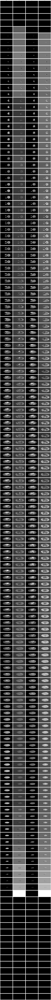

Successfully converted patient 1 with 155 slices to HDF5 format.


In [12]:
# Counter for successfully processed patients
processed_patients = 0

# Process the specified number of patients
for patient_id in range(1, SAMPLE_PATIENTS + 1):
    patient_path = os.path.join(DATA_PATH, f"BraTS20_Training_{patient_id:03d}")

    # Check if patient directory exists and list its contents to avoid errors if NIfTI files are missing
    if not os.path.exists(patient_path):
        print(f"Warning: Directory {patient_path} not found, skipping patient {patient_id}.")
        continue
    print(f"Listing files in {patient_path}")
    !ls {patient_path}

    # Load and standardize modalities, skipping seg.nii as it is considered separately for masks
    volumes = {}
    skip_patient = False
    for modality in MODALITIES:
        nii_path = os.path.join(patient_path, f"BraTS20_Training_{patient_id:03d}_{modality}.nii")
        # Check if NIfTI file exists to avoid errors
        if not os.path.exists(nii_path):
            print(f"Warning: File {nii_path} not found, skipping patient {patient_id}.")
            skip_patient = True
            break
        try:
            volume = nib.load(nii_path).get_fdata()
            # Standardize volume using mean and standard deviation (per DR-Unet104 paper, Eq. 2)
            non_zero = volume[volume > 0]
            if len(non_zero) > 0:
                mean = non_zero.mean()
                std = non_zero.std()
                standardized = np.zeros_like(volume)
                mask = volume > (mean + 3 * std)
                standardized[mask] = 254
                mask = volume < (mean - 3 * std)
                standardized[mask] = 0
                mask = (volume >= (mean - 3 * std)) & (volume <= (mean + 3 * std))
                standardized[mask] = ((volume[mask] - mean) + 127) / (3 * std / 128)
                volumes[modality] = standardized
            else:
                volumes[modality] = volume
        except Exception as e:
            print(f"Error loading {nii_path}: {e}, skipping patient {patient_id}.")
            skip_patient = True
            break

    if skip_patient:
        continue

    # Process each axial slice, excluding seg.nii conversion, and store data
    slice_data = np.zeros((SLICES, IMG_HEIGHT, IMG_WIDTH, 4))  # Preallocate array for all slices
    for z in range(SLICES):
        slice_data[z] = np.stack([volumes[mod][:, :, z] for mod in MODALITIES], axis=-1)
        h5_path = os.path.join(OUTPUT_PATH, f"volume_{patient_id}_slice_{z}.h5")
        try:
            with h5py.File(h5_path, 'w') as f:
                f.create_dataset('image', data=slice_data[z], dtype=np.float32)
        except OSError as e:
            print(f"Error creating HDF5 file {h5_path}: {e}. Skipping write, but proceeding with display.")

    # Display all 155 slices for the 4 channels in one row per slice after processing
    display_slices(slice_data)

    # Include a print statement inside the patient loop to confirm individual patient conversion
    print(f"Successfully converted patient {patient_id} with {SLICES} slices to HDF5 format.")
    processed_patients += 1
    break